# Melanoma Detection Assignment
**Problem Statement:**

 To build a CNN based model which can accurately detect melanoma. Melanoma is a type of cancer that can be deadly if not detected early. It accounts for 75% of skin cancer deaths. A solution which can evaluate images and alert the dermatologists about the presence of melanoma has the potential to reduce a lot of manual effort needed in diagnosis.

# 1. Importing all the Necessary libraries

In [3]:
import os
import shutil
import glob
import numpy as np
import pandas as pd
import pathlib
import PIL
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D, Activation,  InputLayer
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.regularizers import l2

from google.colab import drive
drive.mount('/content/drive') # Mounting the drive as the data available in google drive
%matplotlib inline



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### This assignment uses a dataset of about 2357 images of skin cancer types. The dataset contains 9 sub-directories in each train and test subdirectories. The 9 sub-directories contains the images of 9 skin cancer types respectively.

### The Data is available in the google drive, Path is specified Below

In [4]:
# Path for train and test images
data_dir = '/content/drive/MyDrive/Data/Melanoma/Train_Data'  # Initial Training data provided
train_dir = '/content/drive/MyDrive/Data/Melanoma/Train'   # Creating train data at the ratio of 0.8 from Train_Data directory
test_dir = '/content/drive/MyDrive/Data/Melanoma/Test' # Initial Test data Provided
validation_dir = '/content/drive/MyDrive/Data/Melanoma/Validation'  # Creating Validation data at the ratio of 0.2 from Train_Data Directory

# counting no of images in each train and test directories.,
#image_count_train = len(list(data_dir_train.glob('*/*.jpg')))
#print("Images in train directory:", image_count_train)
#image_count_test = len(list(data_dir_test.glob('*/*.jpg')))
#print("Images in the test Dirctory:",image_count_test)


## Split the Train data in to Train and Validation Data sets

In [5]:
train_validation_ratio = 0.8  # 80% for training, 20% for validation
#train_size = int(image_count_train * train_validation_ratio)

# Split 80-20 from Train data. since the Test set is around 5% of total Train set, lets create validation set from train set. Will use the test set for final model validation
def split_dataset_into_train_and_validation_sets(data_d =data_dir, train_d =train_dir, validation_d = validation_dir , train_test_ratio = 0.8):
    # Create the validation directory if it doesn't exists
    if not os.path.exists(validation_d):
        os.mkdir(validation_d)
    # Create the Training Directory if it doesn't exists
    if not os.path.exists(train_d):
        os.mkdir(train_d)

    num_training_files = 0
    num_validation_file = 0
    for subdir, dirs, files in os.walk(data_d):
        category_name = os.path.basename(subdir)
        print(str(category_name))
        if category_name == os.path.basename(data_d):
          continue
        training_data_category_dir = train_d + '/' + category_name
        validation_data_category_dir = validation_d + '/' + category_name

        if not os.path.exists(training_data_category_dir):    # creating training subdirectory if is doesn't exists
            os.mkdir(training_data_category_dir)

        if not os.path.exists(validation_data_category_dir):    # creating validation subdirectory if is doesn't exists
            os.mkdir(validation_data_category_dir)

        file_list = glob.glob(subdir + '/*.jpg')
        print(str(category_name),"has", len(file_list), "Images")
        random_set = np.random.permutation(len(file_list))

        # move the percentage of data from each category to Validation directory
        train_list = random_set[:round(len(random_set)*(train_test_ratio))]
        validation_list = random_set[-round(len(random_set)* (1- train_test_ratio)):]
        print('train_list', len(train_list))
        print('Validation List', len(validation_list))

        for lists in train_list:
          file_path = file_list[lists]
          shutil.copy(file_path, train_d + '/' + category_name + '/')
          num_training_files += 1

        for lists in validation_list:
          file_path = file_list[lists]
          shutil.copy(file_path, validation_d + '/' + category_name + '/')
          num_validation_file += 1
        print("Processed", str(num_training_files),"Training Images and ", str(num_validation_file), "Validation images")


In [ ]:
# Splitting the data to train and validation with given data.
# split_dataset_into_train_and_validation_sets(data_dir, train_dir, validation_dir, train_validation_ratio)

Train_Data
actinic keratosis
actinic keratosis has 114 Images
train_list 91
Validation List 23
Processed 91 Training Images and  23 Validation images
basal cell carcinoma
basal cell carcinoma has 376 Images
train_list 301
Validation List 75
Processed 392 Training Images and  98 Validation images
dermatofibroma
dermatofibroma has 95 Images
train_list 76
Validation List 19
Processed 468 Training Images and  117 Validation images
melanoma
melanoma has 438 Images
train_list 350
Validation List 88
Processed 818 Training Images and  205 Validation images
nevus
nevus has 357 Images
train_list 286
Validation List 71
Processed 1104 Training Images and  276 Validation images
pigmented benign keratosis
pigmented benign keratosis has 462 Images
train_list 370
Validation List 92
Processed 1474 Training Images and  368 Validation images
seborrheic keratosis
seborrheic keratosis has 77 Images
train_list 62
Validation List 15
Processed 1536 Training Images and  383 Validation images
squamous cell carc

# 2. Loading the images


In [6]:
batch_size =32
img_height = 180
img_width = 180
num_classes =9
epoch = 30

In [7]:
# Load images from directory into a format suitable for training with tensorflow/keras, handling data aumentation and etc..,
train_dataset = image_dataset_from_directory(train_dir,image_size=(img_width,img_height),batch_size=batch_size,label_mode='categorical',seed=123)
test_dataset = image_dataset_from_directory(test_dir,image_size=(img_width,img_height),batch_size=batch_size,label_mode='categorical')
validation_dataset = image_dataset_from_directory(validation_dir,image_size=(img_width,img_height),batch_size=batch_size, label_mode='categorical',seed=123)

Found 2239 files belonging to 9 classes.
Found 118 files belonging to 9 classes.
Found 537 files belonging to 9 classes.


In [8]:
# List out all the classes of skin cancer and store them in a list
class_names = train_dataset.class_names
print(class_names)

['actinic keratosis', 'basal cell carcinoma', 'dermatofibroma', 'melanoma', 'nevus', 'pigmented benign keratosis', 'seborrheic keratosis', 'squamous cell carcinoma', 'vascular lesion']


## Visualizing the data
visualize Validation data, as the training data size is huge.

Visualizing Batch 1


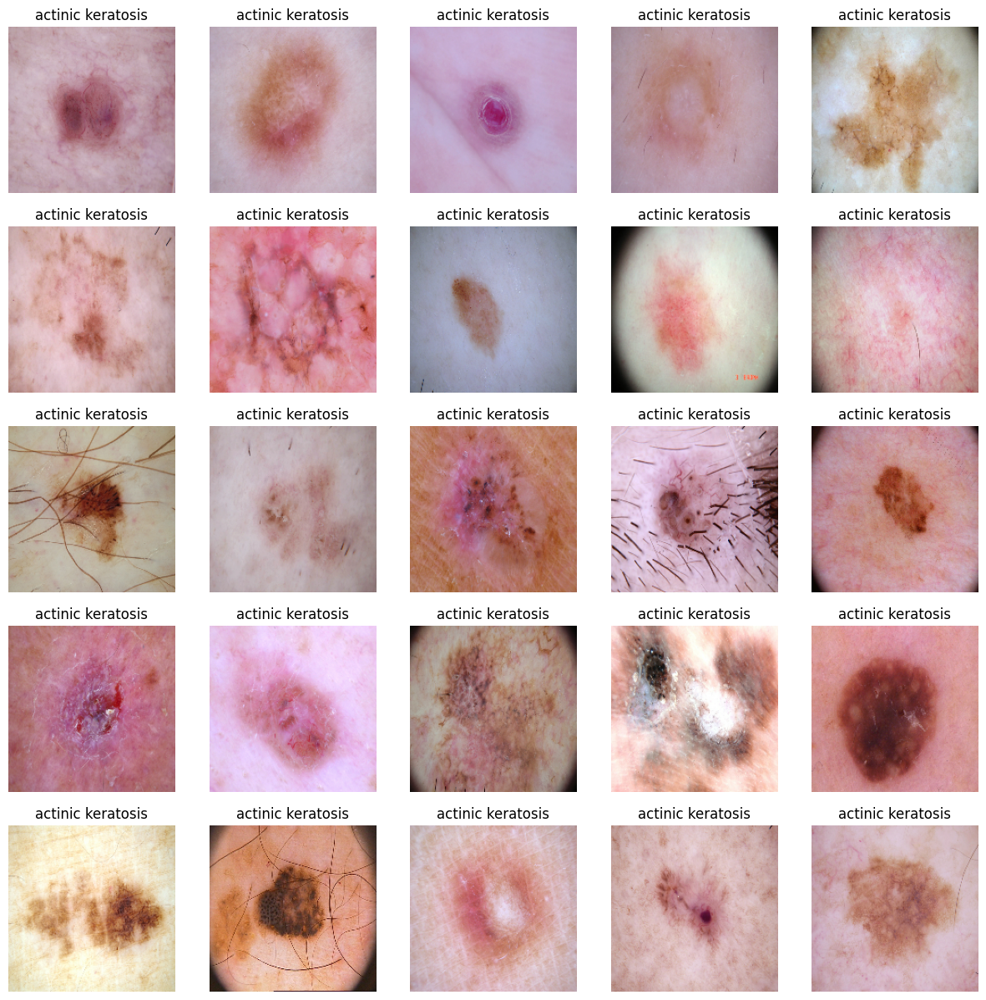

Visualizing Batch 2


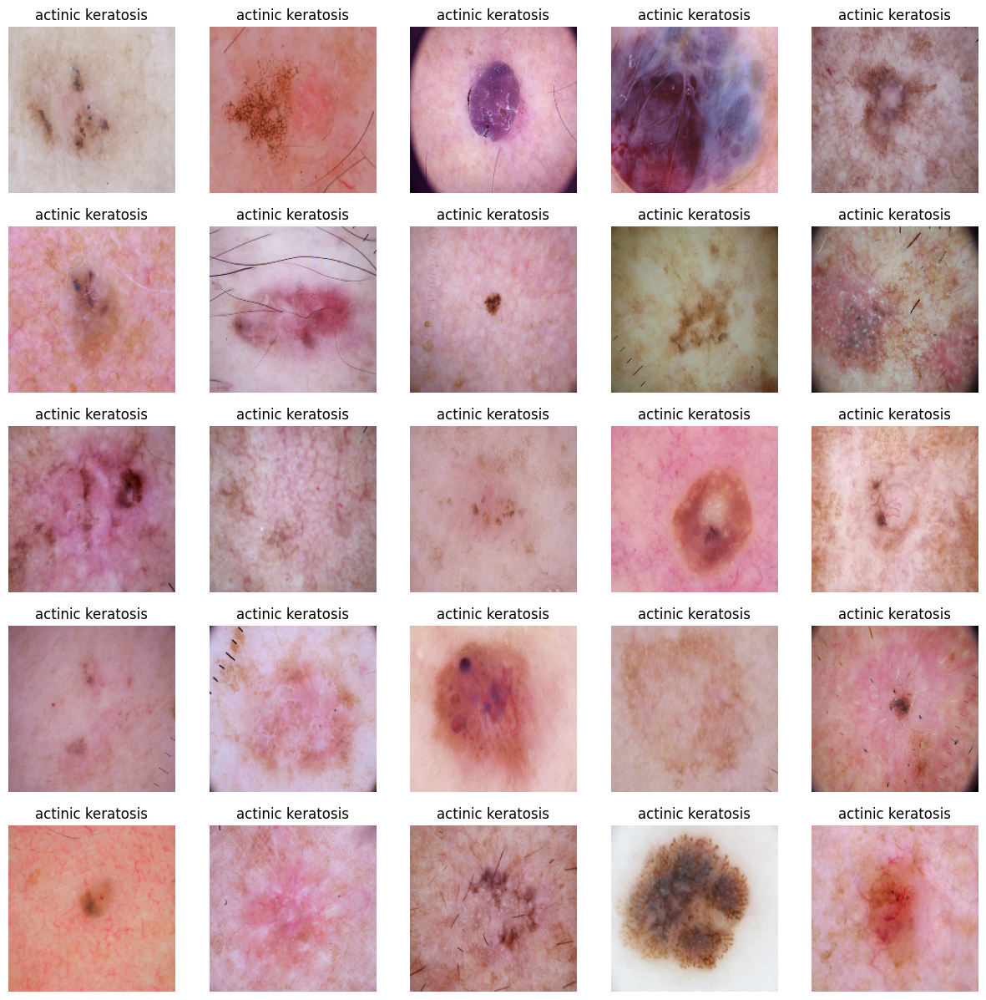

Visualizing Batch 3


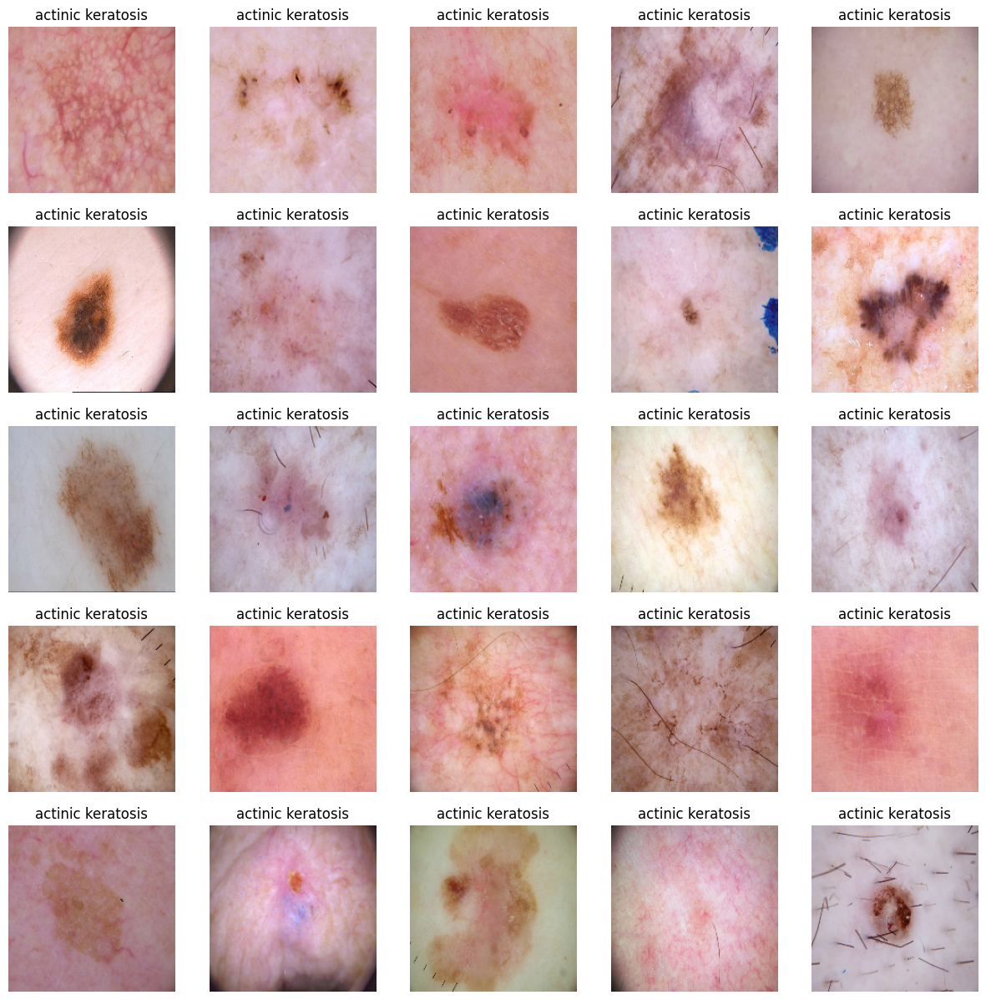

Visualizing Batch 4


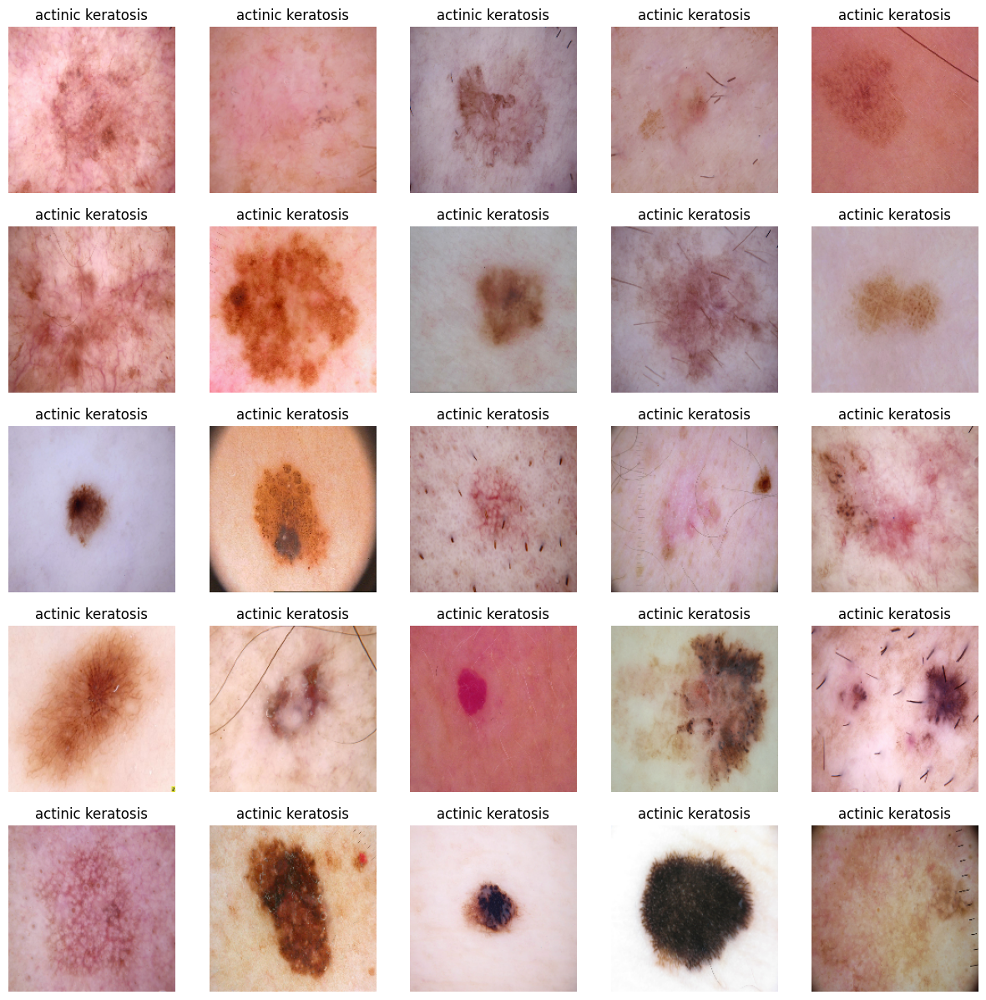

Visualizing Batch 5


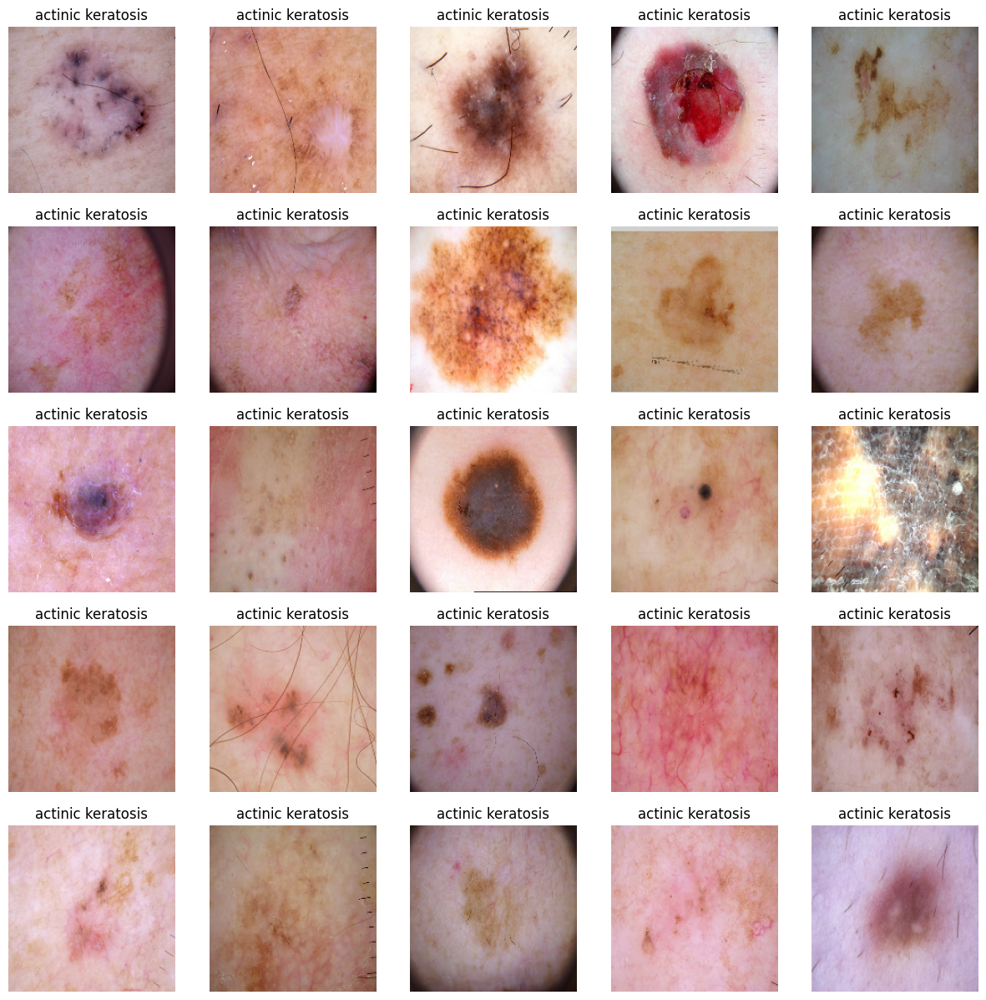

Visualizing Batch 6


In [ ]:
# Iterate over all batches in the validation dataset
for batch, (images, labels) in enumerate(validation_dataset):
    print(f"Visualizing Batch {batch + 1}")
    plt.figure(figsize=(15, 15))  # figure size
    batch_size = images.shape[0]  # Get the actual batch size

    for i in range(batch_size):
        ax = plt.subplot(int(np.ceil(np.sqrt(batch_size))), int(np.ceil(np.sqrt(batch_size))), i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[np.argmax(labels[i])])  # Display the class name using the label
        plt.axis("off")

    plt.show()

The image_batch is a tensor of the shape (32, 180, 180, 3). This is a batch of 32 images of shape 180x180x3 (the last dimension refers to color channels RGB). The label_batch is a tensor of the shape (32,), these are corresponding labels to the 32 images.

Dataset.cache() keeps the images in memory after they're loaded off disk during the first epoch.

Dataset.prefetch() overlaps data preprocessing and model execution while training.

In [7]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.cache().prefetch(buffer_size=AUTOTUNE)

# 3 Create the Simple CNN Model

In [8]:
# Define the Simple CNN model with 3 layers without any Regularization techniques 3 Conv + 2 FC
model = Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(180, 180, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(9, activation='softmax'))  # multiclass classification


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [9]:
# Summary of the model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 178, 178, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 89, 89, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 87, 87, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 43, 43, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 41, 41, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 20, 20, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 51200)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │      26,214,912 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 9)                   │           4,617 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,312,777 (100.38 MB)

 Trainable params: 26,312,777 (100.38 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [11]:
# Train the model
history = model.fit(train_dataset, validation_data = validation_dataset,epochs=epoch)

Epoch 1/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 190s 602ms/step - accuracy: 0.1634 - loss: 78.0271 - val_accuracy: 0.1769 - val_loss: 2.1488
Epoch 2/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.2143 - loss: 2.1224 - val_accuracy: 0.2048 - val_loss: 2.0403
Epoch 3/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.2502 - loss: 2.0117 - val_accuracy: 0.2179 - val_loss: 1.9781
Epoch 4/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.2481 - loss: 1.9999 - val_accuracy: 0.1769 - val_loss: 2.0226
Epoch 5/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.2217 - loss: 2.0148 - val_accuracy: 0.1899 - val_loss: 2.0066
Epoch 6/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.2027 - loss: 1.9867 - val_accuracy: 0.1750 - val_loss: 2.0338
Epoch 7/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.2176 - loss: 2.0022 - val_accuracy: 0.2030 - val_loss: 1.9910
Epoch 8/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.2593 - loss: 1.9450 - val_accuracy: 0.1937

# Visualizing the results over epochs

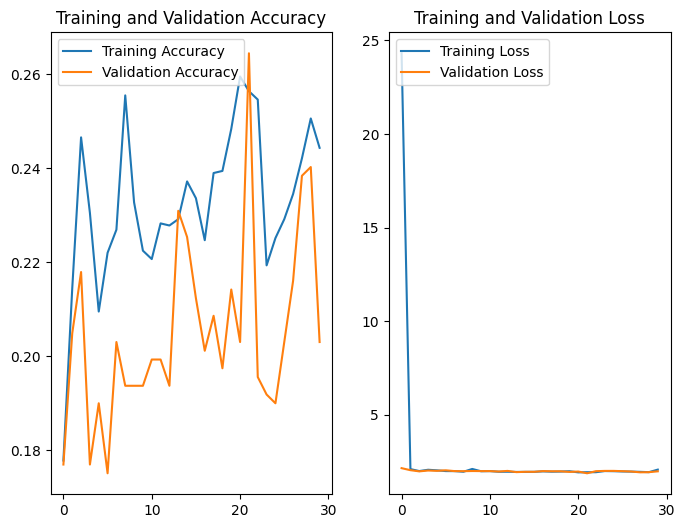

In [12]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epoch)

plt.figure(figsize=(8, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='upper left')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper left')
plt.title('Training and Validation Loss')
plt.show()

## Accuracy of simple Model

Traning accuracy: 25% - loss: 1.9454
Validation accuracy: 20% - loss: 1.9800

This model is underfitting...

In [14]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.cache().prefetch(buffer_size=AUTOTUNE)

# 4. Creating Another CNN Model with Regularization

In [9]:
# Using layers.Rescaling to normalize the pixel values between 0 and 1. The Pixel values are currently between 0 to 255.
normalization_layer = layers.Rescaling(1./255)
normalised_train_dataset = train_dataset.map(lambda x, y: (normalization_layer(x), y))
normalised_validation_dataset = validation_dataset.map(lambda x, y: (normalization_layer(x), y))

In [10]:
# Define the Simple CNN model with 5 Conv layers and 3 FC layers Batch normalization and l2 regularizers.
model = Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(180, 180, 3)))
model.add(BatchNormalization())
model.add(layers.Conv2D(32, (3,3), activation ='relu'))
model.add(BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
#model.add(layers.Dropout(0.5))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
#model.add(layers.Dropout(0.25))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
#model.add(layers.Dropout(0.25))

model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(512, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(layers.Conv2D(512, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))


model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(9, activation='softmax'))  # multiclass classification

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [11]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 178, 178, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 178, 178, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 176, 176, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 176, 176, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 88, 88, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 86, 86, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 86, 86, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 84, 84, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 84, 84, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 42, 42, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 40, 40, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 40, 40, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 38, 38, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 38, 38, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 19, 19, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 17, 17, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 17, 17, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 15, 15, 256)         │         590,0

 Total params: 5,774,889 (22.03 MB)

 Trainable params: 5,770,921 (22.01 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [13]:
history = model.fit(train_dataset, validation_data = validation_dataset,epochs=epoch)

Epoch 1/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 50s 405ms/step - accuracy: 0.3399 - loss: 2.1020 - val_accuracy: 0.2775 - val_loss: 2.5320
Epoch 2/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.4349 - loss: 1.5305 - val_accuracy: 0.3594 - val_loss: 2.2327
Epoch 3/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - accuracy: 0.4559 - loss: 1.5042 - val_accuracy: 0.4227 - val_loss: 1.9126
Epoch 4/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - accuracy: 0.5006 - loss: 1.3880 - val_accuracy: 0.3594 - val_loss: 2.3489
Epoch 5/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.5184 - loss: 1.3444 - val_accuracy: 0.4302 - val_loss: 1.8201
Epoch 6/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - accuracy: 0.5002 - loss: 1.3348 - val_accuracy: 0.4916 - val_loss: 1.6094
Epoch 7/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - accuracy: 0.5601 - loss: 1.2533 - val_accuracy: 0.2942 - val_loss: 2.1461
Epoch 8/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.5658 - loss: 1.2613 - val_accuracy: 0.5251 -

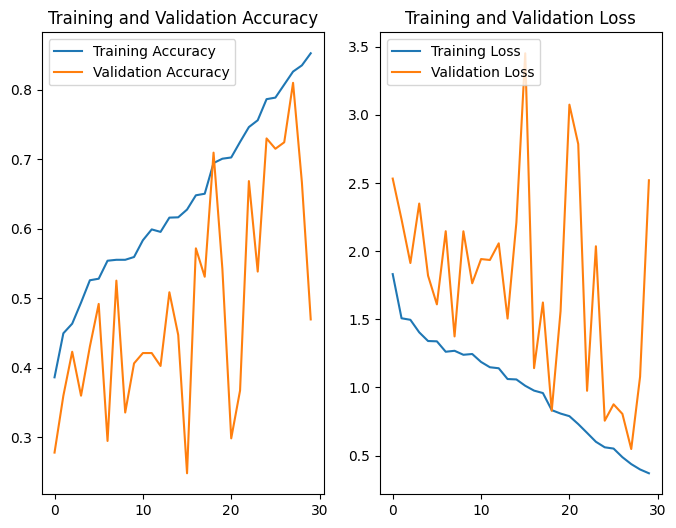

In [14]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epoch)

plt.figure(figsize=(8, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='upper left')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper left')
plt.title('Training and Validation Loss')
plt.show()

### Adding Additional Convolution layers + FC Layers and BatchNormalization improved validation accuracy. But starts overfitting.


# 5. Creating a model by Handling Class Imbalance

### 5.1 Checking the balance of images in each classes

In [15]:
train_dataset = image_dataset_from_directory(directory = train_dir, batch_size=batch_size, image_size=(img_width,img_height),seed=123)
validation_dataset = image_dataset_from_directory(directory = validation_dir,batch_size=batch_size, image_size=(img_width,img_height),seed=123)

Found 2239 files belonging to 9 classes.
Found 537 files belonging to 9 classes.


In [23]:
# Create a Dataframe to see the no of images for each classes
labels = np.array([])
for images, label_batch in train_dataset:
  labels = np.concatenate((labels, label_batch))

df = pd.DataFrame(np.unique(labels, return_counts=True)).T
df.columns = ['Class','Count']
df['class_name'] = df['Class'].apply(lambda x: class_names[int(x)])
df

,Class,Count,class_name
0,0.0,114.0,actinic keratosis
1,1.0,376.0,basal cell carcinoma
2,2.0,95.0,dermatofibroma
3,3.0,438.0,melanoma
4,4.0,357.0,nevus
5,5.0,462.0,pigmented benign keratosis
6,6.0,77.0,seborrheic keratosis
7,7.0,181.0,squamous cell carcinoma
8,8.0,139.0,vascular lesion


### Viewing Cancer Data Distribution

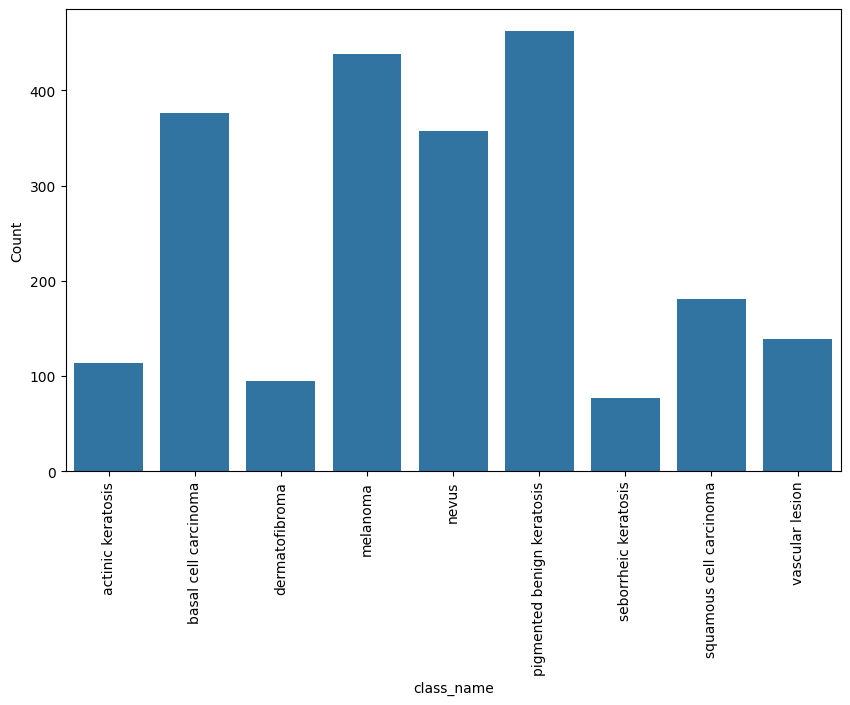

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.barplot(x='class_name', y='Count', data=df)
plt.xticks(rotation=90)
plt.show()

### Looking at the Data set, Class imbalance is present in the data set. Need to handle this with Augumentation techniques to address this issue

### 5.2 To use Augmentor, the following general procedure is followed:

  1.Instantiate a Pipeline object pointing to a directory containing your initial image data set.
2. Define a number of operations to perform on this data set using your Pipeline object.
3.
Execute these operations by calling the Pipeline’s sample() method.

In [ ]:
!pip install Augmentor
import Augmentor


In [ ]:
for class_name in class_names:
  p = Augmentor.Pipeline(data_dir + '/' + class_name)
  p.rotate(probability=0.7, max_left_rotation=10, max_right_rotation=10) # Generating images by rotation of 10 degress on both left and right sides.
  p.sample(500) # No of samples to be generated using the above rotations. Adding 500 samples per class.

Initialised with 114 image(s) found.
Output directory set to /content/drive/MyDrive/Data/Melanoma/Train_Data/actinic keratosis/output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=600x450 at 0x7A47D09DA590>: 100%|██████████| 500/500 [00:05<00:00, 87.80 Samples/s] 


Initialised with 376 image(s) found.
Output directory set to /content/drive/MyDrive/Data/Melanoma/Train_Data/basal cell carcinoma/output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=600x450 at 0x7A47D09F5780>: 100%|██████████| 500/500 [00:05<00:00, 94.75 Samples/s] 


Initialised with 95 image(s) found.
Output directory set to /content/drive/MyDrive/Data/Melanoma/Train_Data/dermatofibroma/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7A47D0837BB0>: 100%|██████████| 500/500 [00:04<00:00, 103.63 Samples/s]


Initialised with 438 image(s) found.
Output directory set to /content/drive/MyDrive/Data/Melanoma/Train_Data/melanoma/output.

Processing <PIL.Image.Image image mode=RGB size=1024x768 at 0x7A46B41071F0>: 100%|██████████| 500/500 [00:14<00:00, 35.38 Samples/s]


Initialised with 357 image(s) found.
Output directory set to /content/drive/MyDrive/Data/Melanoma/Train_Data/nevus/output.

Processing <PIL.Image.Image image mode=RGB size=2048x1536 at 0x7A469F59B250>: 100%|██████████| 500/500 [00:15<00:00, 32.02 Samples/s]


Initialised with 462 image(s) found.
Output directory set to /content/drive/MyDrive/Data/Melanoma/Train_Data/pigmented benign keratosis/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7A46FD71DF90>: 100%|██████████| 500/500 [00:06<00:00, 79.61 Samples/s]


Initialised with 77 image(s) found.
Output directory set to /content/drive/MyDrive/Data/Melanoma/Train_Data/seborrheic keratosis/output.

Processing <PIL.Image.Image image mode=RGB size=1024x768 at 0x7A47507D51B0>: 100%|██████████| 500/500 [00:06<00:00, 73.03 Samples/s]


Initialised with 181 image(s) found.
Output directory set to /content/drive/MyDrive/Data/Melanoma/Train_Data/squamous cell carcinoma/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7A479C04CF40>: 100%|██████████| 500/500 [00:05<00:00, 88.05 Samples/s] 


Initialised with 139 image(s) found.
Output directory set to /content/drive/MyDrive/Data/Melanoma/Train_Data/vascular lesion/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7A479C07BB20>: 100%|██████████| 500/500 [00:06<00:00, 76.17 Samples/s] 


In [16]:
# Creating new train data set from Augmented data set
new_train_dataset = image_dataset_from_directory(
  data_dir,
  seed=123,
  validation_split = 0.2,
  subset = 'training',
  image_size=(img_width, img_height),
  batch_size=32)

Found 6739 files belonging to 9 classes.
Using 5392 files for training.


In [17]:
# Creating new validation data set from Augmented data set
new_validation_dataset = image_dataset_from_directory(
  data_dir,
  seed=123,
  validation_split = 0.2,
  subset = 'validation',
  image_size=(img_width, img_height),
  batch_size=32)

Found 6739 files belonging to 9 classes.
Using 1347 files for validation.


In [18]:
# prefetching the dataset
AUTOTUNE = tf.data.AUTOTUNE
new_train_dataset = new_train_dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
new_validation_dataset = new_validation_dataset.cache().prefetch(buffer_size=AUTOTUNE)

### 5.3 Budiling the model with Augmented data set

In [ ]:
 # Same as previous model
 # 5 Conv layers of different data frames of sizes in each layers(32,64,128,256 and 512) with paddings.
 # after each layers having Batch Normalization
 # Adding a dropout
 # 3 Dense Layers with l2 regularizer.

In [20]:
model = Sequential([
    layers.Rescaling(1./255,input_shape =( img_width, img_width,3 )),
    layers.Conv2D(32, (3, 3), padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(32, (3,3), activation ='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Conv2D(64, (3, 3),padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Conv2D(128, (3, 3),padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    layers.Conv2D(256, (3, 3), padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(256, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.10),


    layers.Conv2D(512, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(512, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.10),



    layers.Flatten(),
    layers.Dense(1024, activation='relu',kernel_regularizer=l2(0.001),bias_regularizer=l2(0.001)), # Regularization
    layers.Dense(512, activation='relu',kernel_regularizer=l2(0.001),bias_regularizer=l2(0.001)), # Regularization
    layers.Dense(256, activation='relu',kernel_regularizer=l2(0.001),bias_regularizer=l2(0.001)), # Regularization
    layers.Dense(num_classes, activation='softmax'),  # multiclass classification
])

In [21]:
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling_2 (Rescaling)              │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_20 (Conv2D)                   │ (None, 180, 180, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_20               │ (None, 180, 180, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_21 (Conv2D)                   │ (None, 178, 178, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_21               │ (None, 178, 178, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 89, 89, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 89, 89, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_22 (Conv2D)                   │ (None, 89, 89, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_22               │ (None, 89, 89, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_23 (Conv2D)                   │ (None, 87, 87, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_23               │ (None, 87, 87, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 43, 43, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 43, 43, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_24 (Conv2D)                   │ (None, 43, 43, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_24               │ (None, 43, 43, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_25 (Conv2D)                   │ (None, 41, 41, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_25               │ (None, 41, 41, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 20, 20, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 7,476,777 (28.52 MB)

 Trainable params: 7,472,809 (28.51 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [22]:
history=model.fit(new_train_dataset,validation_data=new_validation_dataset,epochs=30)

Epoch 1/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 153s 699ms/step - accuracy: 0.3006 - loss: 4.3484 - val_accuracy: 0.1262 - val_loss: 4.4416
Epoch 2/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step - accuracy: 0.4065 - loss: 3.0186 - val_accuracy: 0.2101 - val_loss: 3.3421
Epoch 3/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - accuracy: 0.4493 - loss: 2.3317 - val_accuracy: 0.3437 - val_loss: 2.6803
Epoch 4/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - accuracy: 0.4706 - loss: 1.9407 - val_accuracy: 0.4625 - val_loss: 1.8687
Epoch 5/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - accuracy: 0.5251 - loss: 1.6339 - val_accuracy: 0.4477 - val_loss: 1.9346
Epoch 6/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - accuracy: 0.5604 - loss: 1.4677 - val_accuracy: 0.3816 - val_loss: 2.4833
Epoch 7/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - accuracy: 0.5678 - loss: 1.3522 - val_accuracy: 0.4870 - val_loss: 1.8678
Epoch 8/30
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - accuracy: 0.6322 - loss: 1.2015 

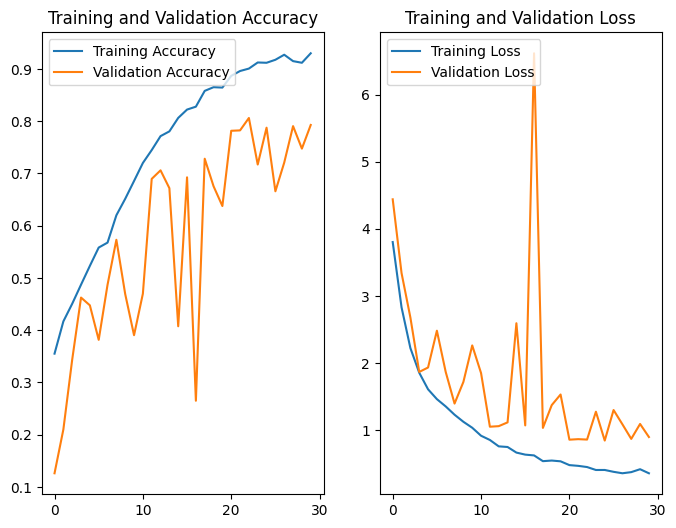

In [23]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(30)

plt.figure(figsize=(8, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='upper left')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper left')
plt.title('Training and Validation Loss')
plt.show()

In [24]:
model.save("/content/drive/My Drive/Augmentor_Model.keras")

# 6. Testing the Model with test data set

In [26]:
# Creating new validation data set from Augmented data set
validation_dataset = image_dataset_from_directory(
  validation_dir,
  seed=123,
  image_size=(img_width, img_height),
  batch_size=32)

Found 537 files belonging to 9 classes.


In [27]:
model.evaluate(validation_dataset)

17/17 ━━━━━━━━━━━━━━━━━━━━ 6s 362ms/step - accuracy: 0.8391 - loss: 0.7266


[0.785818338394165, 0.8193668723106384]

In [ ]:
# loading test dataset from directory for verification
test_dataset = image_dataset_from_directory(directory=test_dir, batch_size=batch_size, image_size=(img_width, img_height), seed=123)

# evaluate the model on the test dataset
model.evaluate(test_dataset) # Data set is too small and batch size is big, hence no of epoch will be small. So the accuracy expected is also less.

Found 118 files belonging to 9 classes.
5/5 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.4447 - loss: 3.2260


[3.279776096343994, 0.4406779706478119]

# 7.  SUMMARY

First Model:  val_accuracy: 0.2030 - val_loss: 1.9800
Second Model: val_accuracy: 0.4693 - val_loss: 2.5196
Third Model:  val_accuracy: 0.7929 - val_loss: 0.8986

Third model is doing pretty decent job with Rescaling, Augmentation, L2 regularization of kernel and bias. Also perform well on the validation data set.